In [1]:
from nansat import Nansat
from nansat import *

from s1denoise import Sentinel1Image
from s1denoise import *
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np

In [2]:
s1_path = '/container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip'
s1 = Sentinel1Image(s1_path)
s1

08:09:04|40|nansat|_get_dataset_metadata|GDAL could not open /container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip, trying to read with Nansat mappers...


----------------------------------------
/container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip----------------------------------------
Mapper: sentinel1_l1Band : 1 DN_VH
  dataType: 2
  name: DN_VH
  SourceBand: 1
  SourceFilename: /vsizip//container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.SAFE/measurement/s1b-iw-grd-vh-20210716t054037-20210716t054102-027815-0351b0-002.tiff
Band : 2 DN_VV
  dataType: 2
  name: DN_VV
  SourceBand: 1
  SourceFilename: /vsizip//container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.SAFE/measurement/s1b-iw-grd-vv-20210716t054037-20210716t054102-027815-0351b0-001.tiff
Band : 3 sigmaNought_VH
  dataType: 7
  name: sigmaNought_VH
  SourceBand: 1
  SourceFilename: /vsimem/6D2XU9RVJY.vrt
Band : 4 noise_

In [3]:
s1 = Nansat(s1_path)
s1

08:09:34|40|nansat|_get_dataset_metadata|GDAL could not open /container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip, trying to read with Nansat mappers...


----------------------------------------
/container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip----------------------------------------
Mapper: sentinel1_l1Band : 1 DN_VH
  dataType: 2
  name: DN_VH
  SourceBand: 1
  SourceFilename: /vsizip//container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.SAFE/measurement/s1b-iw-grd-vh-20210716t054037-20210716t054102-027815-0351b0-002.tiff
Band : 2 DN_VV
  dataType: 2
  name: DN_VV
  SourceBand: 1
  SourceFilename: /vsizip//container_dir1/subsets/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.zip/S1B_IW_GRDH_1SDV_20210716T054037_20210716T054102_027815_0351B0_E546.SAFE/measurement/s1b-iw-grd-vv-20210716t054037-20210716t054102-027815-0351b0-001.tiff
Band : 3 sigmaNought_VH
  dataType: 7
  name: sigmaNought_VH
  SourceBand: 1
  SourceFilename: /vsimem/K81TYZBN4Z.vrt
Band : 4 noise_

In [4]:
type(s1)

nansat.nansat.Nansat

In [5]:
s0_vh = s1[8]
s0_vv = s1[10]

sn_vh = s1[3]
sn_vv = s1[5]

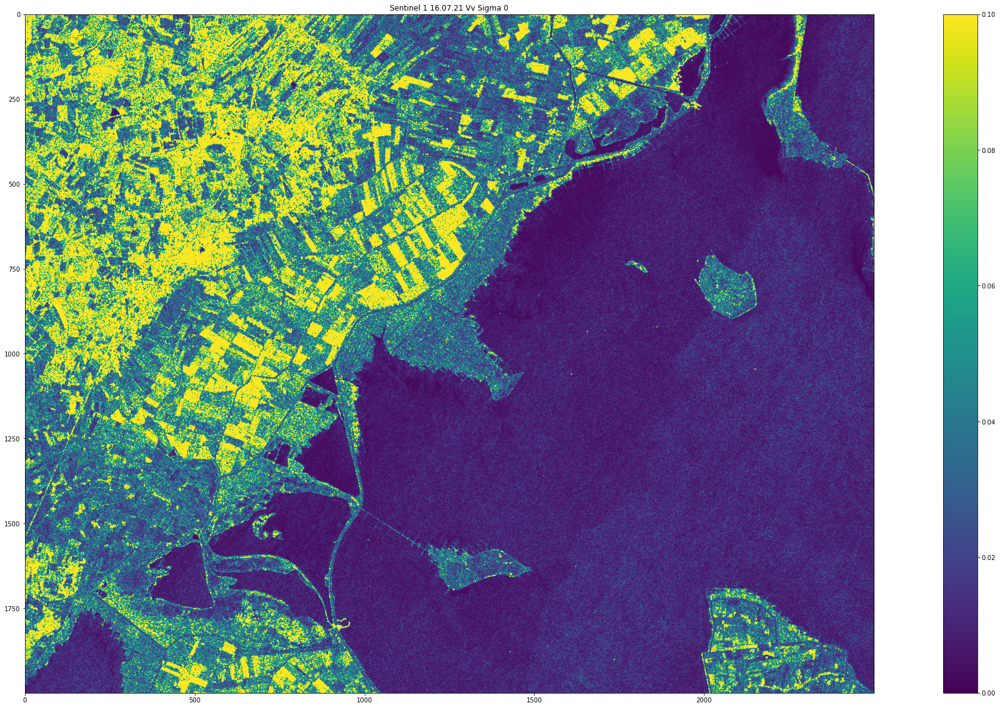

In [6]:
fig = plt.figure(figsize=(40,20))
fig.add_subplot(1, 1, 1)
plt.imshow(s0_vv[11000:13000, 11500:14000], vmin=0, vmax=0.1);plt.colorbar()
plt.axis('on')
plt.title('Sentinel 1 16.07.21 Vv Sigma 0')
plt.savefig('s1_VV_S0.png')

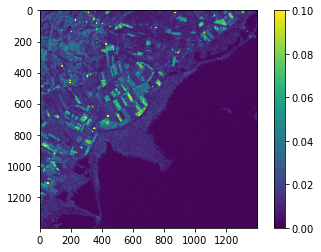

In [20]:
imgage_arr = np.array(s0_vh)

mask_array = s0_vh[11100:12500, 12100:13500]

plt.imshow(mask_array, vmin=0, vmax=0.1);plt.colorbar()
plt.show()
#plt.savefig('/container_dir1/results/test_fig.png')
#plt.imsave('/container_dir1/results/test_figure.png', mask_array)

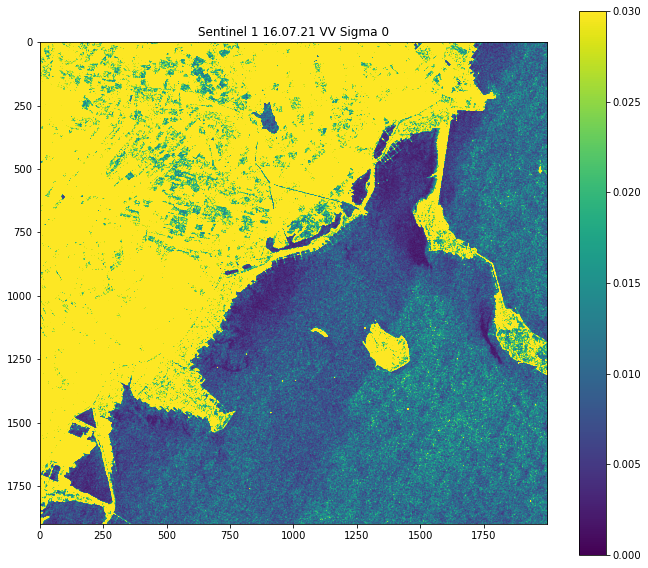

In [21]:
fig = plt.figure(figsize=(25,10))

fig.add_subplot(1, 2, 1)
plt.imshow(s0_vv[10600:12500, 12200:14200], vmin=0, vmax=0.03);plt.colorbar()
plt.axis('on')
plt.title('Sentinel 1 16.07.21 VV Sigma 0')
plt.savefig('s1_VV_S0_3.png')

#fig.add_subplot(1, 2, 2)
#plt.imshow(s0_vv[10600:12500, 12200:14200], vmin=0, vmax=0.02);plt.colorbar()
#plt.axis('on')
#plt.title('VV S 0')

Text(0.5, 1.0, 'VV S 0')

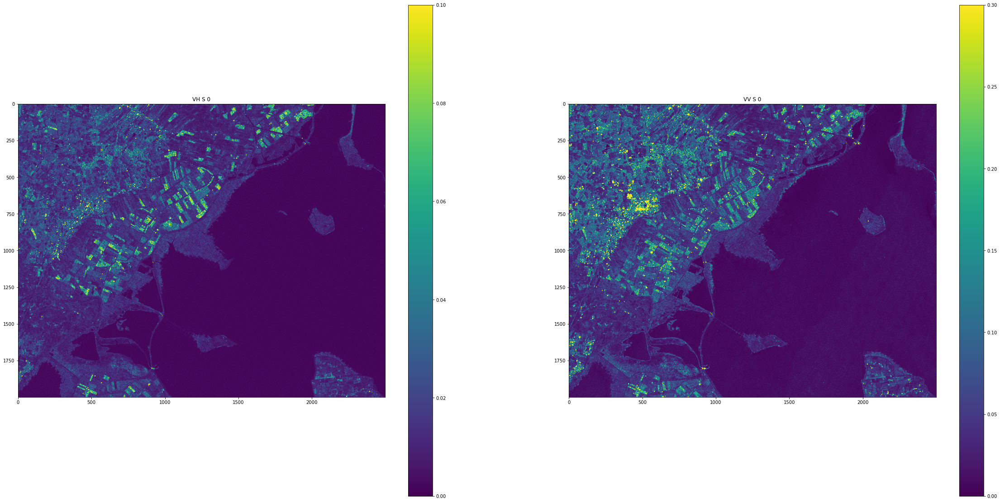

In [22]:
fig = plt.figure(figsize=(40,20))

fig.add_subplot(1, 2, 1)
plt.imshow(s0_vh[11000:13000, 11500:14000], vmin=0, vmax=0.1);plt.colorbar()
plt.axis('on')
plt.title('VH S 0')

fig.add_subplot(1, 2, 2)
plt.imshow(s0_vv[11000:13000, 11500:14000], vmin=0, vmax=0.3);plt.colorbar()
plt.axis('on')
plt.title('VV S 0')

In [23]:
### Define domain
#n = gdal.Open(s2_path)
#d = Domain(ds = n)
s1r = s1
d = Domain('+proj=longlat', '-te 8.76 54.56 8.91 54.66 -tr 0.00001 0.00001')

In [24]:
### Reproject data
s1r.reproject(d)
### why does the s1.reproject(d) & then s1r = s1 work, but not s1r = s1.reproject(d)? then assigning s0_vh etc. gives error *object of nonetype not subscriptable*

In [25]:
s0_vh = s1r[8]
s0_vv = s1r[10]

sn_vh = s1r[3]
sn_vv = s1r[5]

Text(0.5, 1.0, 'VV S0')

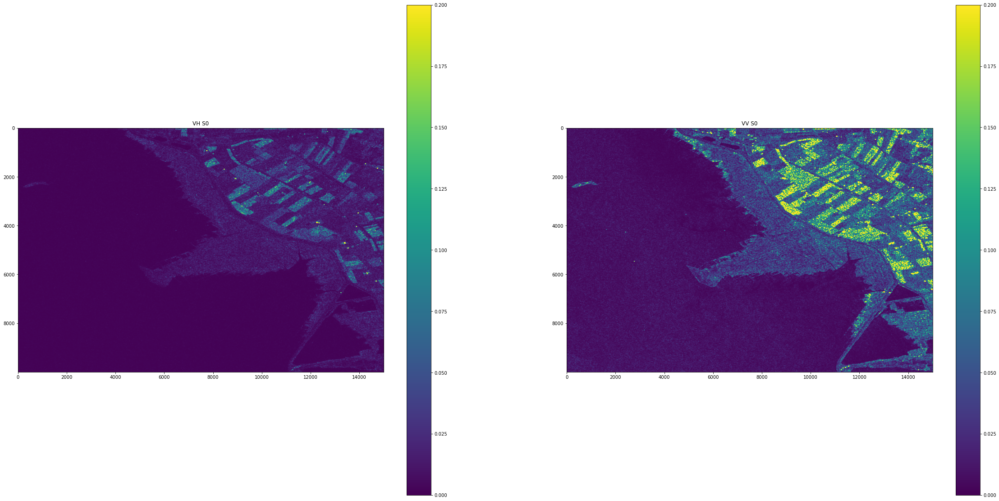

In [26]:
fig = plt.figure(figsize=(40,20))

fig.add_subplot(1, 2, 1)
plt.imshow(s0_vh, vmin=0, vmax=0.2);plt.colorbar()
plt.axis('on')
plt.title('VH S0')

fig.add_subplot(1, 2, 2)
plt.imshow(s0_vv, vmin=0, vmax=0.2);plt.colorbar()
plt.axis('on')
plt.title('VV S0')

In [8]:
s2_path = '/container_dir1/subsets/Subset_S2_20210716_resampled.tif'

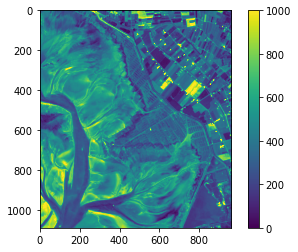

----------------------------------------
/container_dir1/subsets/Subset_S2_20210716_resampled.tif----------------------------------------
Mapper: genericBand : 1 band_000
  dataType: 2
  name: band_000
  SourceBand: 1
  SourceFilename: /container_dir1/subsets/Subset_S2_20210716_resampled.tif
  wkv: 
Band : 2 band_001
  dataType: 2
  name: band_001
  SourceBand: 2
  SourceFilename: /container_dir1/subsets/Subset_S2_20210716_resampled.tif
  wkv: 
Band : 3 band_002
  dataType: 2
  name: band_002
  SourceBand: 3
  SourceFilename: /container_dir1/subsets/Subset_S2_20210716_resampled.tif
  wkv: 
Band : 4 band_003
  dataType: 2
  name: band_003
  SourceBand: 4
  SourceFilename: /container_dir1/subsets/Subset_S2_20210716_resampled.tif
  wkv: 
Band : 5 band_004
  dataType: 2
  name: band_004
  SourceBand: 5
  SourceFilename: /container_dir1/subsets/Subset_S2_20210716_resampled.tif
  wkv: 
Band : 6 band_005
  dataType: 2
  name: band_005
  SourceBand: 6
  SourceFilename: /container_dir1/subsets/

In [27]:
s2 = Nansat(s2_path)
b2 = s2[1]
plt.imshow(b2, vmin=0, vmax=1000);plt.colorbar()
plt.show()
s2

In [28]:
blue = b2/1000
green = s2[2]/1000
red = s2[3]/1000
nir = s2[4]
swir_1 = s2[5]
swir_2 = s2[6]

# matplotlib only can plot 8bit imagery between 0-255 or float between 0 and 1. dividing the Sentinel 2 data by 1000 before plotting it to decrease brightness

In [53]:
blue.shape

rgb_img.shape

rgb_img[1].shape

rgb_img2 = np.concatenate((red, green, blue), axis=1)

rgb_img2.shape

(1091, 2880)

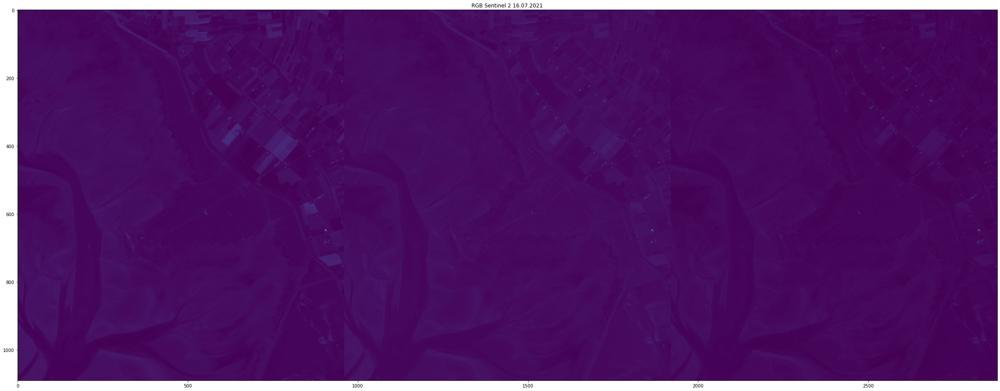

In [54]:
rgb_img = np.stack((red, green, blue), axis=2)
rgb_img.shape


fig = plt.figure(figsize=(40,20))
fig.add_subplot(1, 1, 1)
plt.imshow(rgb_img2)
plt.title('RGB Sentinel 2 16.07.2021')
plt.savefig('rgb.png')

Text(0.5, 1.0, 'VV S0')

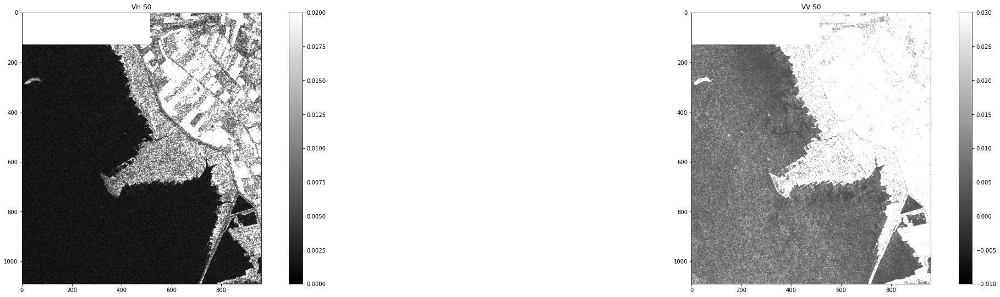

In [10]:
#n1 = gdal.Open(s1_path)
#d_s1 = Domain(ds=n1)

from osgeo import gdal
n = gdal.Open(s2_path)
d_s2 = Domain(ds=n)

s1r = s1
s1r.reproject(d_s2)

s0_vh = s1r[8]
s0_vv = s1r[10]

fig = plt.figure(figsize=(40,20))

fig.add_subplot(2, 2, 1)
plt.imshow(s0_vh, vmin=0, vmax=0.02, cmap='gray');plt.colorbar()
plt.axis('on')
plt.title('VH S0')
plt.savefig('test_fig_vh.png')


fig.add_subplot(2, 2, 2)
plt.imshow(s0_vv, vmin=-0.01, vmax=0.03, cmap='gray');plt.colorbar()
plt.axis('on')
plt.title('VV S0')
#plt.savefig('test_fig_vv.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


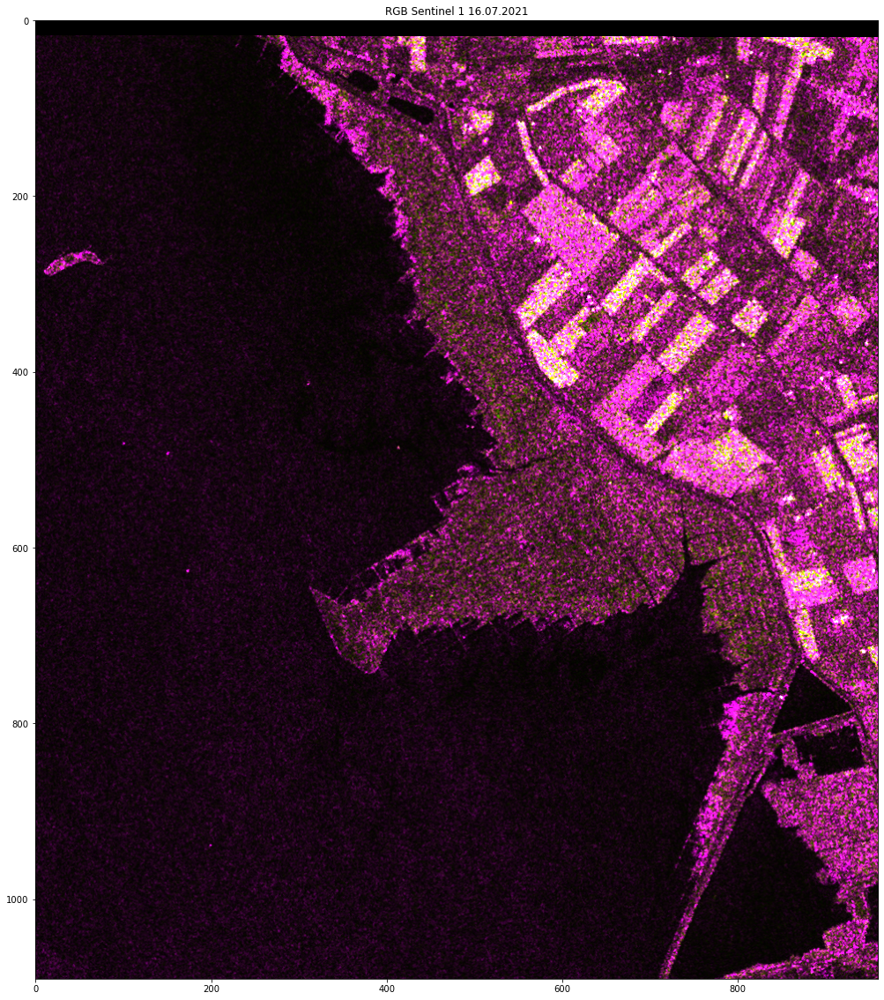

In [31]:
red_s1 = s0_vv*10
green_s1 = s0_vh*10
blue_s1 = (s0_vv-s0_vh)*10

rgb_s1_img = np.stack((red_s1, green_s1, blue_s1), axis=2)
rgb_s1_img.shape


fig = plt.figure(figsize=(40,20))
fig.add_subplot(1, 1, 1)
plt.imshow(rgb_s1_img)
plt.title('RGB Sentinel 1 16.07.2021')
plt.savefig('rgb_s1.png')

In [32]:
#plt.savefig('/container_dir1/results/test_fig.png')
#arr = np.array(s0_vh)
#plt.imsave('test_figure.png', arr=arr)

In [33]:
vis = Nansat('/container_dir1/subsets/VIs_Subset_S2B_MSIL2A_20210716.tif')
awei = Nansat('/container_dir1/subsets/AWEI_S2B_MSIL2A_20210716.tif')
ndwi = Nansat('/container_dir1/subsets/NDWI_S2B_MSIL2A_20210716.tif')

awei = awei[1]
ndwi = ndwi[1]

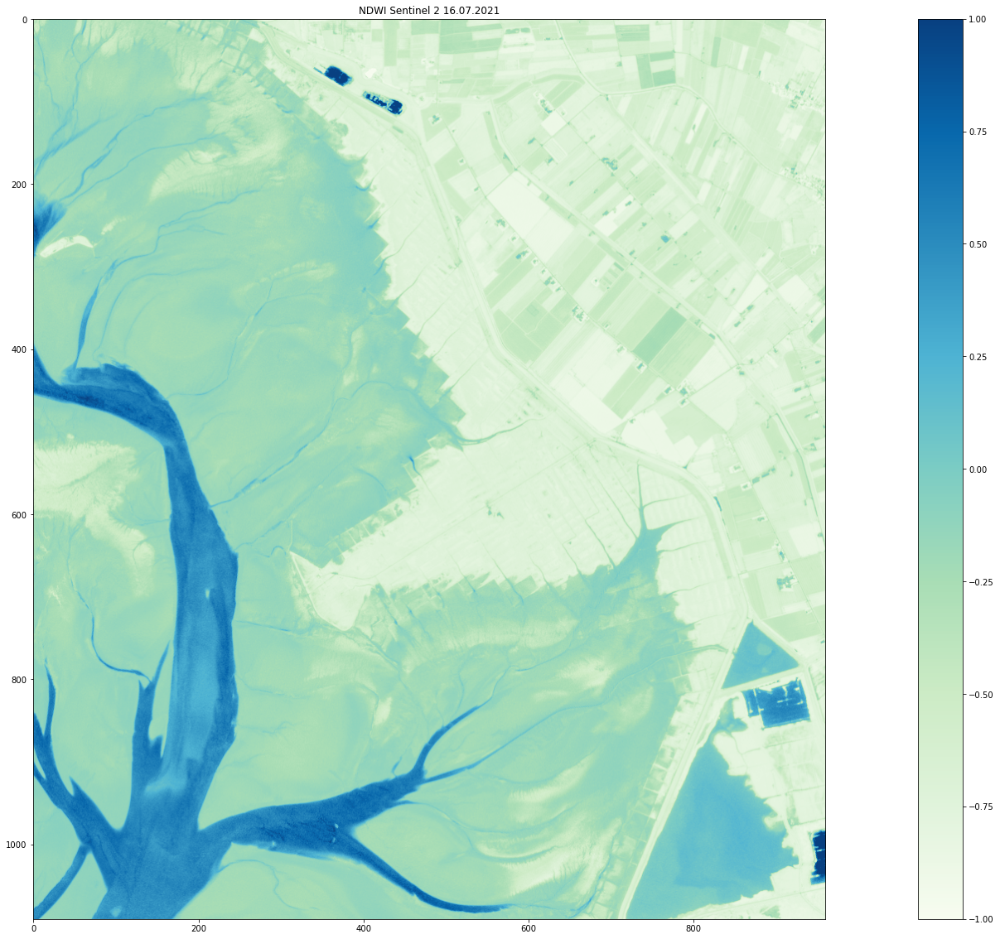

In [34]:
ndvi = vis[1]
savi = vis[2]
msavi = vis[3]
ndmi = vis[4]
evi = vis[5]

fig = plt.figure(figsize=(40,20))
fig.add_subplot(1, 1, 1)
plt.imshow(ndwi, vmin=-1, vmax=1, cmap='GnBu');plt.colorbar()
plt.title('NDWI Sentinel 2 16.07.2021')
plt.savefig('ndwi.png')


# ndmi cmap: gist_earth_r (rwon to blue), range -1 to 1
# ndvi/evi/savi/msavi RdYlGn, range -1 to 1
# awei: GnBu, -1 to 1

In [44]:
#s1 = Sentinel1Image(s1_path)
#s1.reproject(d_s2)
### nach dem reprojizieren ist es ein gdal objekt, das sich nicht entrauschen lässt mit 
s1.remove_thermal_noise('VH')
## Für VV fehlt derdiedas IPF 3.31
## Und VH produziert einfach nur nans ohne irgendeine Erklärung

#s0_vh = s1.remove_texture_noise('HH')

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [5]:
from osgeo import gdal
s2_path = '/container_dir1/subsets/Subset_S2_20210716_resampled.tif'
n = gdal.Open(s2_path)
d_s2 = Domain(ds=n)

s1.reproject(d_s2)

s0_vh_r = s1[8]
s0_vv_r = s1[10]

fig = plt.figure(figsize=(40,20))

fig.add_subplot(2, 2, 1)
plt.imshow(s0_vh_r, vmin=0, vmax=0.02, cmap='gray');plt.colorbar()
plt.axis('on')
plt.title('VH S0')
plt.savefig('test_fig_vh.png')


fig.add_subplot(2, 2, 2)
plt.imshow(s0_vv_r, vmin=-0.01, vmax=0.03, cmap='gray');plt.colorbar()
plt.axis('on')
plt.title('VV S0')
#plt.savefig('test_fig_vv.png')

NameError: name 's0vv' is not defined